# Скачивание датасета

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
!pip install Soccernet -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.7/85.7 kB 3.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.3/104.3 MB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 21.5 MB/s eta 0:00:00


In [ ]:
from SoccerNet.Downloader import SoccerNetDownloader
mySoccerNetDownloader = SoccerNetDownloader(LocalDirectory="SoccerNetGS")
mySoccerNetDownloader.downloadDataTask(task="gamestate-2024",
                                       split=["train", "test", "valid", "challenge"])

In [ ]:

!unzip SoccerNetGS/gamestate-2024/train.zip -d train
!unzip SoccerNetGS/gamestate-2024/test.zip -d test
!unzip SoccerNetGS/gamestate-2024/valid.zip -d valid
!unzip SoccerNetGS/gamestate-2024/challenge.zip -d challenge


Выходные данные были обрезаны до нескольких последних строк (5000).
  inflating: train/SNGS-109/img1/000102.jpg  
  inflating: train/SNGS-109/img1/000057.jpg  
  inflating: train/SNGS-109/img1/000076.jpg  
  inflating: train/SNGS-109/img1/000136.jpg  
  inflating: train/SNGS-109/img1/000562.jpg  
  inflating: train/SNGS-109/img1/000407.jpg  
  inflating: train/SNGS-109/img1/000105.jpg  
  inflating: train/SNGS-109/img1/000101.jpg  
  inflating: train/SNGS-109/img1/000704.jpg  
  inflating: train/SNGS-109/img1/000138.jpg  
  inflating: train/SNGS-109/img1/000639.jpg  
  inflating: train/SNGS-109/img1/000091.jpg  
  inflating: train/SNGS-109/img1/000297.jpg  
  inflating: train/SNGS-109/img1/000432.jpg  
  inflating: train/SNGS-109/img1/000393.jpg  
  inflating: train/SNGS-109/img1/000573.jpg  
  inflating: train/SNGS-109/img1/000552.jpg  
  inflating: train/SNGS-109/img1/000314.jpg  
  inflating: train/SNGS-109/img1/000695.jpg  
  inflating: train/SNGS-109/img1/000347.jpg  
  inflating:

# Установка Detectrone2 и нужных компонентов

In [ ]:
!python -m pip install pyyaml==5.1 -q

!python -m pip install 'git+https://github.com/facebookresearch/detectron2.git' -q

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 274.2/274.2 kB 19.0 MB/s eta 0:00:00
  error: subprocess-exited-with-error
  
  × python setup.py egg_info did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Preparing metadata (setup.py) ... error
error: metadata-generation-failed

× Encountered error while generating package metadata.
╰─> See above for output.

note: This is an issue with the package mentioned above, not pip.
hint: See above for details.
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB 4.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.2/79.2 kB 7.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.0/117.0 kB 12.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 kB 15.2 MB

In [ ]:
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import cv2
import matplotlib.pyplot as plt
import json
import os
import torch
import copy

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.data.datasets import register_coco_instances
from detectron2.engine import DefaultTrainer
from detectron2.data import detection_utils as utils
from detectron2.data import transforms as T
from detectron2.data import build_detection_train_loader
from detectron2.evaluation import COCOEvaluator, DatasetEvaluators
from detectron2.data import detection_utils as utils
import detectron2.data.transforms as T




# Анализ датасета
Для примера возьмем JSON файл обучающего датасета с ответами на изображения

Можно увидеть субкатегории и объекты:

In [ ]:

with open('/content/drive/MyDrive/data/SoccerNetGS/train/SNGS-060/Labels-GameState.json') as f:
    data = json.load(f)

# Предполагаем, что categories находится на верхнем уровне в файле
categories = data.get('categories', [])

# Создаем словарь, чтобы сохранить supercategories и соответствующие им names
supercategory_dict = {}

# Проходим по каждой категории и собираем names по supercategory
for category in categories:
    supercategory = category.get('supercategory')
    name = category.get('name')

    if supercategory:
        if supercategory not in supercategory_dict:
            supercategory_dict[supercategory] = []
        supercategory_dict[supercategory].append(name)

# Выводим результаты
for supercategory, names in supercategory_dict.items():
    print(f"Supercategory: {supercategory}")
    print(f"Names: {names}\n")



Субкатегории pitch и camera можем убрать из обработки. Так как наша задача в детекции мяча, следовательно нам понадобятся только игроки и мяч.
В субкатегории camera содержатся данные о положении главной камеры и её перемещениях. В субкатегории pitch находятся данные о разметки линий, границ полей, участков, флангов футбольного поля.

Далее напишем функции для обработки датасета и удаления не нужных данных.

# Функции для обработки датасета

In [ ]:
def delete_supercategories(file_path):
    # Загружаем данные из файла
    with open(file_path, 'r') as f:
        data = json.load(f)

    # Предполагаем, что categories находится на верхнем уровне в файле
    categories = data.get('categories', [])

    # Фильтруем категории, удаляя те, которые содержат указанные supercategories
    filtered_categories = [
        category for category in categories
        if category.get('supercategory') not in ['pitch', 'camera']
    ]

    data['categories'] = filtered_categories

    annotations = data.get('annotations', [])

    # Фильтруем аннотации, удаляя те, которые имеют указанные supercategories
    filtered_annotations = [
        annotation for annotation in annotations
        if annotation.get('supercategory') not in ['pitch', 'camera']
    ]
    # Обновляем категории в данных
    data['annotations'] = filtered_annotations

    # Сохраняем изменения обратно в файл
    with open(file_path, 'w') as f:
        json.dump(data, f, indent=4)


transform_coco_json работает с уже существующими параметрами. В предоставленных JSON файлах значения id, image_id предоставлены в строковом формате. Данный формат нужно преобразовать в числовой для правильной обработке модели.

In [ ]:
def transform_coco_json(json_path):

    # Открываем JSON файл
    with open(json_path, 'r', encoding='utf-8') as f:
        coco_data = json.load(f)

    # Присваиваем уникальные ID для изображений
    if 'images' in coco_data:
        for idx, image in enumerate(coco_data['images']):
            # Преобразуем id в числовое значение, если оно строка
            if isinstance(image['image_id'], str):
                image['id'] = int(image['image_id'])

    # Преобразуем 'image_id' и 'id' в числовые значения в секции 'annotations'
    if 'annotations' in coco_data:
        for annotation in coco_data['annotations']:
            # Преобразуем image_id в числовое значение, если оно строка
            if isinstance(annotation['image_id'], str):
                annotation['image_id'] = int(annotation['image_id'])
            # Преобразуем id в числовое значение, если оно строка
            if isinstance(annotation['id'], str):
                annotation['id'] = int(annotation['id'])


    # Сохраняем изменения обратно в новый JSON файл
    with open(json_path, 'w', encoding='utf-8') as f:
        json.dump(coco_data, f, ensure_ascii=False, indent=4)  #про аски штуку убрать или добавить кудато




add_bbox_to_coco_annotations добавляет поле bbox_images в аннотацию к каждому кадру и объекту.

In [ ]:

def add_bbox_to_coco_annotations(json_path):
    with open(json_path, 'r', encoding='utf-8') as f:
        data = json.load(f)

    # Проверка, является ли data словарем и содержит ли он ключ 'annotations'
    if isinstance(data, dict) and 'annotations' in data:
        annotations = data['annotations']  # Получаем список аннотаций
    else:
        print("Expected a dictionary with 'annotations' key but got:", type(data))
        return

    # Обновление аннотаций
    for annotation in annotations:
        # Проверка, что каждая аннотация — это словарь
        if not isinstance(annotation, dict):
            print("Expected a dictionary for annotation but got:", type(annotation))
            continue

        # Извлекаем значения из bbox_image
        bbox_image = annotation.get('bbox_image')
        if bbox_image is None:
            print("bbox_image not found in annotation:", annotation)
            continue

        x = bbox_image.get('x')
        y = bbox_image.get('y')
        w = bbox_image.get('w')
        h = bbox_image.get('h')

        # Проверка на None
        if None in (x, y, w, h):
            print("One of the bbox_image values is missing:", bbox_image)
            continue

        # Добавляем новое поле bbox
        annotation['bbox'] = [x, y, w, h]

    # Сохраняем обновленные аннотации в файл
    with open(json_path, 'w', encoding='utf-8') as f:
        json.dump(data, f, indent=4)



# Конвертируем train_dataset

In [ ]:
# Укажите путь к вашему каталогу с датасетами
base_path = '/content/train'
dataset_names = []
# Проходимся по всем каталогам
for i in range(60, 171):  # Измените 100 на необходимый верхний предел
    dataset_name = f'SNGS-{i:03}'
    dataset_path = os.path.join(base_path, dataset_name)

    # Проверьте, существует ли каталог
    if os.path.exists(dataset_path):
        # Предполагаем, что у вас есть файл аннотаций COCO в формате JSON
        json_file = os.path.join(dataset_path, 'Labels-GameState.json')  # Измените на имя вашего файла с аннотациями
        image_root = dataset_path + '/img1'  # Путь к изображениям
        dataset_names.append(dataset_name)

        delete_supercategories(json_file)
        transform_coco_json(json_file)
        add_bbox_to_coco_annotations(json_file)

        # Регистрируем датасет
        register_coco_instances(dataset_name, {}, json_file, image_root)
        print(f"Dataset {dataset_name} registered.")
    else:
        print(f"Dataset {dataset_name} not found.")


Dataset SNGS-060 registered.
Dataset SNGS-061 registered.
Dataset SNGS-062 registered.
Dataset SNGS-063 registered.
Dataset SNGS-064 registered.
Dataset SNGS-065 registered.
Dataset SNGS-066 registered.
Dataset SNGS-067 registered.
Dataset SNGS-068 registered.
Dataset SNGS-069 registered.
Dataset SNGS-070 registered.
Dataset SNGS-071 registered.
Dataset SNGS-072 registered.
Dataset SNGS-073 registered.
Dataset SNGS-074 registered.
Dataset SNGS-075 registered.
Dataset SNGS-076 registered.
Dataset SNGS-077 registered.
Dataset SNGS-078 not found.
Dataset SNGS-079 not found.
Dataset SNGS-080 not found.
Dataset SNGS-081 not found.
Dataset SNGS-082 not found.
Dataset SNGS-083 not found.
Dataset SNGS-084 not found.
Dataset SNGS-085 not found.
Dataset SNGS-086 not found.
Dataset SNGS-087 not found.
Dataset SNGS-088 not found.
Dataset SNGS-089 not found.
Dataset SNGS-090 not found.
Dataset SNGS-091 not found.
Dataset SNGS-092 not found.
Dataset SNGS-093 not found.
Dataset SNGS-094 not found.
Da

In [ ]:
combined_train_dataset = []

# Объединяем все датасеты
for name in dataset_names:
    if DatasetCatalog.get(name):  # Проверяем, зарегистрирован ли датасет
        dataset_dicts = DatasetCatalog.get(name)
        combined_train_dataset.extend(dataset_dicts)

# Регистрация объединенного датасета
DatasetCatalog.register('train_dataset', lambda: combined_train_dataset)
metadata = MetadataCatalog.get('train_dataset').set(thing_classes=["player", "goalkeeper", "referee", "ball", "other"])

# Загружаем объединенный датасет
train_dataset = DatasetCatalog.get('train_dataset')


# имя зареганого датасета train_dataset


WARNING [10/07 17:24:33 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[10/07 17:24:33 d2.data.datasets.coco]: Loaded 750 images in COCO format from /content/drive/MyDrive/test-sberai/SoccerNetGS/gamestate-2024/train/SNGS-060/Labels-GameState.json
WARNING [10/07 17:24:34 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[10/07 17:24:34 d2.data.datasets.coco]: Loaded 750 images in COCO format from /content/drive/MyDrive/test-sberai/SoccerNetGS/gamestate-2024/train/SNGS-060/Labels-GameState.json
WARNING [10/07 17:24:34 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[10/07 17:24:34 d2.data.datasets.coco]: Loaded 750 images in COCO format from /content/drive/MyDrive/test-sberai/SoccerNetGS/gamestate-2024/train/SNGS-061/Labels-GameState.json
WARNING [10/07 17:24:34 d2.data.datasets.coco]: 
Catego

In [ ]:
# Укажите путь к файлу, в который вы хотите сохранить объединенный датасет
output_json_path = 'train_dataset.json'

# Сохраняем объединенный датасет в формате JSON
with open(output_json_path, 'w') as f:
    json.dump(train_dataset, f)

print(f"train_dataset  saved to {output_json_path}")

train_dataset  saved to train_dataset.json


# Конвертируем test_dataset

In [ ]:
# Укажите путь к вашему каталогу с датасетами
base_path = '/content/test'
dataset_names = []
# Проходимся по всем каталогам
for i in range(115, 201):  # Измените 100 на необходимый верхний предел
    dataset_name = f'SNGS-{i:03}'
    dataset_path = os.path.join(base_path, dataset_name)

    # Проверьте, существует ли каталог
    if os.path.exists(dataset_path):
        # Предполагаем, что у вас есть файл аннотаций COCO в формате JSON
        json_file = os.path.join(dataset_path, 'Labels-GameState.json')  # Измените на имя вашего файла с аннотациями
        image_root = dataset_path + '/img1'  # Путь к изображениям
        dataset_names.append(dataset_name)

        delete_supercategories(json_file)
        transform_coco_json(json_file)
        add_bbox_to_coco_annotations(json_file)

        # Регистрируем датасет
        register_coco_instances(dataset_name, {}, json_file, image_root)
        print(f"Dataset {dataset_name} registered.")
    else:
        print(f"Dataset {dataset_name} not found.")


In [ ]:
combined_test_dataset = []

# Объединяем все датасеты
for name in dataset_names:
    if DatasetCatalog.get(name):  # Проверяем, зарегистрирован ли датасет
        dataset_dicts = DatasetCatalog.get(name)
        combined_test_dataset.extend(dataset_dicts)

# Регистрация объединенного датасета
DatasetCatalog.register('test_dataset', lambda: combined_test_dataset)
metadata = MetadataCatalog.get('test_dataset')

# Загружаем объединенный датасет
test_dataset = DatasetCatalog.get('test_dataset')


# имя зареганого датасета test_dataset


In [ ]:
# Укажите путь к файлу, в который вы хотите сохранить объединенный датасет
output_json_path = 'test_dataset.json'

# Сохраняем объединенный датасет в формате JSON
with open(output_json_path, 'w') as f:
    json.dump(test_dataset, f)

print(f"test_dataset  saved to {output_json_path}")

# Конвертируем valid_dataset

In [ ]:
# Укажите путь к вашему каталогу с датасетами
base_path = '/content/valid'
dataset_names = []
# Проходимся по всем каталогам
for i in range(20, 100):  # Измените 100 на необходимый верхний предел
    dataset_name = f'SNGS-{i:03}'
    dataset_path = os.path.join(base_path, dataset_name)

    # Проверьте, существует ли каталог
    if os.path.exists(dataset_path):
        # Предполагаем, что у вас есть файл аннотаций COCO в формате JSON
        json_file = os.path.join(dataset_path, 'Labels-GameState.json')  # Измените на имя вашего файла с аннотациями
        image_root = dataset_path + '/img1'  # Путь к изображениям
        dataset_names.append(dataset_name)

        delete_supercategories(json_file)
        transform_coco_json(json_file)
        add_bbox_to_coco_annotations(json_file)

        # Регистрируем датасет
        register_coco_instances(dataset_name, {}, json_file, image_root)
        print(f"Dataset {dataset_name} registered.")
    else:
        print(f"Dataset {dataset_name} not found.")


Dataset SNGS-020 not found.
Dataset SNGS-021 registered.
Dataset SNGS-022 registered.
Dataset SNGS-023 registered.
Dataset SNGS-024 registered.
Dataset SNGS-025 registered.
Dataset SNGS-026 registered.
Dataset SNGS-027 registered.
Dataset SNGS-028 registered.
Dataset SNGS-029 registered.
Dataset SNGS-030 registered.
Dataset SNGS-031 registered.
Dataset SNGS-032 registered.
Dataset SNGS-033 registered.
Dataset SNGS-034 registered.
Dataset SNGS-035 registered.
Dataset SNGS-036 registered.
Dataset SNGS-037 registered.
Dataset SNGS-038 registered.
Dataset SNGS-039 registered.
Dataset SNGS-040 registered.
Dataset SNGS-041 registered.
Dataset SNGS-042 registered.
Dataset SNGS-043 registered.
Dataset SNGS-044 registered.
Dataset SNGS-045 registered.
Dataset SNGS-046 registered.
Dataset SNGS-047 registered.
Dataset SNGS-048 registered.
Dataset SNGS-049 registered.
Dataset SNGS-050 registered.
Dataset SNGS-051 registered.
Dataset SNGS-052 registered.
Dataset SNGS-053 registered.
Dataset SNGS-05

In [ ]:
combined_valid_dataset = []

# Объединяем все датасеты
for name in dataset_names:
    if DatasetCatalog.get(name):  # Проверяем, зарегистрирован ли датасет
        dataset_dicts = DatasetCatalog.get(name)
        combined_valid_dataset.extend(dataset_dicts)

# Регистрация объединенного датасета
DatasetCatalog.register('valid_dataset', lambda: combined_valid_dataset)
metadata = MetadataCatalog.get('valid_dataset').set(thing_classes=["player", "goalkeeper", "referee", "ball", "other"])

# Загружаем объединенный датасет
valid_dataset = DatasetCatalog.get('valid_dataset')


# имя зареганого датасета valid_dataset

WARNING [10/07 17:29:20 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[10/07 17:29:20 d2.data.datasets.coco]: Loaded 750 images in COCO format from /content/valid/SNGS-021/Labels-GameState.json
WARNING [10/07 17:29:20 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[10/07 17:29:20 d2.data.datasets.coco]: Loaded 750 images in COCO format from /content/valid/SNGS-021/Labels-GameState.json
[10/07 17:29:21 d2.data.datasets.coco]: Loading /content/valid/SNGS-022/Labels-GameState.json takes 1.11 seconds.
WARNING [10/07 17:29:21 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[10/07 17:29:21 d2.data.datasets.coco]: Loaded 750 images in COCO format from /content/valid/SNGS-022/Labels-GameState.json
WARNING [10/07 17:29:22 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categor

In [ ]:
# Укажите путь к файлу, в который вы хотите сохранить объединенный датасет
output_json_path = 'valid_dataset.json'

# Сохраняем объединенный датасет в формате JSON
with open(output_json_path, 'w') as f:
    json.dump(valid_dataset, f)

print(f"valid_dataset  saved to {output_json_path}")

valid_dataset  saved to valid_dataset.json


# Добавим аугментацию данных
 * Увеличение изображения
 * Уменьшение изображения
 * Отзеркаливание по горизонтале

Таким образом, для каждого исходного изображения будет создано:

1 (увеличение)+1 (уменьшение)+0.2 (отзеркаливание)=2.2 новых изображений

In [ ]:
from detectron2.data import detection_utils as utils
import detectron2.data.transforms as T
import copy
import torch

def custom_mapper(dataset_dict):
    # Чтение изображения
    if not os.path.exists(dataset_dict["file_name"]):
        print(f"Файл не найден: {dataset_dict['file_name']}")
        return None  # Пропуск данного примера

    # Чтение изображения
    image = utils.read_image(dataset_dict["file_name"], format="BGR")

    # Копирование dataset_dict для безопасных изменений
    dataset_dict = dataset_dict.copy()

    # Определяем список аугментаций
    transform_list = [
        T.Resize((int(image.shape[0] * 1.2), int(image.shape[1] * 1.2))),  # Увеличение
        T.Resize((int(image.shape[0] * 0.8), int(image.shape[1] * 0.8))),  # Уменьшение
        T.RandomFlip(horizontal=True, prob=0.2),  # Отзеркаливание по горизонтали
    ]

    # Применение аугментаций
    image, transforms = T.apply_transform_gens(transform_list, image)

    # Преобразование изображения в формат для PyTorch
    dataset_dict["image"] = torch.as_tensor(image.transpose(2, 0, 1).astype("float32"))

    # Применение трансформаций к аннотациям и фильтрация
    annos = [
        utils.transform_instance_annotations(obj, transforms, image.shape[:2])
        for obj in dataset_dict.pop("annotations", [])
        if obj.get("iscrowd", 0) == 0
    ]

    # Преобразование аннотаций в объекты для Detectron2
    instances = utils.annotations_to_instances(annos, image.shape[:2])

    # Фильтрация пустых объектов (если все bounding boxes пустые)
    dataset_dict["instances"] = utils.filter_empty_instances(instances)

    return dataset_dict


Для того чтобы использовать аугментацию во время обучения, нам нужно унаследовать класс CustomTrainer от родительского DefaultTrainer и добавить метод build_train_loader, который будет обращаться к функции аугментации (custom_mapper)

In [ ]:
from detectron2.engine import DefaultTrainer
from detectron2.data import build_detection_test_loader, build_detection_train_loader

class CustomTrainer(DefaultTrainer):
    @classmethod
    def build_train_loader(cls, cfg):
        return build_detection_train_loader(cfg, mapper=custom_mapper)



# Обучение

### Выбрать предобученную model zoo

[Список моделей](https://github.com/facebookresearch/detectron2/blob/main/MODEL_ZOO.md)

## Конфигурация для обучения

In [ ]:
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_101_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("train_dataset",)  #указываем имя для датасета
cfg.DATASETS.TEST = ('valid_dataset', )  # validation data
cfg.DATALOADER.NUM_WORKERS = 8
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_101_FPN_3x.yaml")  # Веса для инициализации
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00025  # Learning rate
cfg.SOLVER.MAX_ITER = 5000   # Количество итераций
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128  # Number of regions of interest
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 5  # Количество классов в вашем наборе данных

with open("/config.yaml", "w") as f:
    f.write(cfg.dump())


In [ ]:
trainer = CustomTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[10/07 17:39:37 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}


[10/07 17:39:41 d2.engine.train_loop]: Starting training from iteration 0
[10/07 17:40:04 d2.utils.events]:  eta: 1:23:38  iter: 19  total_loss: 2.812  loss_cls: 1.717  loss_box_reg: 0.7943  loss_rpn_cls: 0.1194  loss_rpn_loc: 0.1703    time: 1.0158  last_time: 1.0544  data_time: 0.1778  last_data_time: 0.0211   lr: 4.9953e-06  max_mem: 5827M
[10/07 17:40:24 d2.utils.events]:  eta: 1:23:10  iter: 39  total_loss: 2.78  loss_cls: 1.662  loss_box_reg: 0.8214  loss_rpn_cls: 0.1175  loss_rpn_loc: 0.1807    time: 1.0127  last_time: 1.0436  data_time: 0.0309  last_data_time: 0.0564   lr: 9.9902e-06  max_mem: 5827M
[10/07 17:40:45 d2.utils.events]:  eta: 1:23:28  iter: 59  total_loss: 2.583  loss_cls: 1.535  loss_box_reg: 0.8173  loss_rpn_cls: 0.1033  loss_rpn_loc: 0.1634    time: 1.0222  last_time: 0.9790  data_time: 0.0416  last_data_time: 0.0226   lr: 1.4985e-05  max_mem: 5827M
[10/07 17:41:06 d2.utils.events]:  eta: 1:24:25  iter: 79  total_loss: 2.444  loss_cls: 1.344  loss_box_reg: 0.785

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


In [ ]:
from detectron2.checkpoint import Checkpointer

# После того, как модель обучена
checkpointer = Checkpointer(trainer.model, save_dir="/content/output")
checkpointer.save("model_final")  # Название файла для сохранения

# Результаты обучения. Метрики

In [ ]:
from detectron2.data import DatasetCatalog, MetadataCatalog, build_detection_test_loader
from detectron2.evaluation import COCOEvaluator, inference_on_dataset

cfg = get_cfg()

cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "/content/output/model_final")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7
predictor = DefaultPredictor(cfg)

evaluator = COCOEvaluator("test_dataset", cfg, False, output_dir="/content/output")
val_loader = build_detection_test_loader(cfg, "test_dataset")
inference_on_dataset(trainer.model, val_loader, evaluator)

[10/07 22:24:54 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /content/drive/MyDrive/data/SoccerNetGS/model_final_5class.pth ...


/usr/local/lib/python3.10/dist-packages/fvcore/common/checkpoint.py:252: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  return torch.load(f, map_location=torch.device("cpu"))

WARNING [10/07 22:25:18 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
[10/07 22:25:18 d2.evaluation.coco_evaluation]: Trying to convert 'test_dataset' to COCO format ...
[10/07 22:25:18 d2.data.datasets.coco]: Converting annotations of dataset 'test_dataset' to COCO format ...)


KeyError: "Dataset 'test_dataset' is not registered! Available datasets are: coco_2014_train, coco_2014_val, coco_2014_minival, coco_2014_valminusminival, coco_2017_train, coco_2017_val, coco_2017_test, coco_2017_test-dev, coco_2017_val_100, keypoints_coco_2014_train, keypoints_coco_2014_val, keypoints_coco_2014_minival, keypoints_coco_2014_valminusminival, keypoints_coco_2017_train, keypoints_coco_2017_val, keypoints_coco_2017_val_100, coco_2017_train_panoptic_separated, coco_2017_train_panoptic_stuffonly, coco_2017_train_panoptic, coco_2017_val_panoptic_separated, coco_2017_val_panoptic_stuffonly, coco_2017_val_panoptic, coco_2017_val_100_panoptic_separated, coco_2017_val_100_panoptic_stuffonly, coco_2017_val_100_panoptic, lvis_v1_train, lvis_v1_val, lvis_v1_test_dev, lvis_v1_test_challenge, lvis_v0.5_train, lvis_v0.5_val, lvis_v0.5_val_rand_100, lvis_v0.5_test, lvis_v0.5_train_cocofied, lvis_v0.5_val_cocofied, cityscapes_fine_instance_seg_train, cityscapes_fine_sem_seg_train, cityscapes_fine_instance_seg_val, cityscapes_fine_sem_seg_val, cityscapes_fine_instance_seg_test, cityscapes_fine_sem_seg_test, cityscapes_fine_panoptic_train, cityscapes_fine_panoptic_val, voc_2007_trainval, voc_2007_train, voc_2007_val, voc_2007_test, voc_2012_trainval, voc_2012_train, voc_2012_val, ade20k_sem_seg_train, ade20k_sem_seg_val"

# Делаем предсказания и выводим картинки с bbox


Для начала нужно инициализировать Predictor

In [ ]:
import torch
from detectron2.config import get_cfg
from detectron2.engine import DefaultPredictor
from detectron2 import model_zoo

# Загрузка конфигурации
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_101_FPN_3x.yaml"))

# Путь к обученной модели
cfg.MODEL.WEIGHTS = "/content/output/model_final.pth"  # Замените на путь к вашей модели
cfg.MODEL.DEVICE = "cuda"
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  # Установите порог уверенности для детекции
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 5  # Задайте количество классов

# Создайте предсказатель
predictor = DefaultPredictor(cfg)


[10/08 13:29:44 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /content/drive/MyDrive/data/SoccerNetGS/model_final_5class.pth ...


/usr/local/lib/python3.10/dist-packages/fvcore/common/checkpoint.py:252: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  return torch.load(f, map_location=torch.device("cpu"))

## Предсказание на data-challenge изображениях + отрисока траектории и BBOX + конвертация в видео

In [14]:
import cv2
import os
import time

# Путь к директории challenge и для сохранения результатов
base_dir = "/content/challenge"
output_dir = "/content/data/SoccerNetGS/output"

# Указать частоту кадров для видео (например, 30 кадров в секунду)
fps = 30
trajectory_lifetime = 5  # время жизни траектории в секундах
min_score_for_trajectory = 0.6  # минимальная уверенность для отрисовки траектории
max_distance_change = 500  # Максимальное расстояние изменения позиции мяча

# Названия классов
class_names = ["player", "goalkeeper", "referee", "ball", "other"]

# Функция для вычисления евклидова расстояния
def euclidean_distance(pt1, pt2):
    return math.sqrt((pt1[0] - pt2[0]) ** 2 + (pt1[1] - pt2[1]) ** 2)

# Функция для создания видео с предсказаниями и траекторией мяча
def create_video_with_predictions_and_trajectory(img_dir, output_video_path, fps, predictor):
    # Получаем список всех файлов в папке img1
    images = [img for img in sorted(os.listdir(img_dir)) if img.endswith(".jpg") or img.endswith(".png")]

    # Проверяем, есть ли изображения
    if len(images) == 0:
        print(f"В папке {img_dir} нет изображений!")
        return

    # Считываем первый кадр для получения размера видео
    first_image_path = os.path.join(img_dir, images[0])
    frame = cv2.imread(first_image_path)
    height, width, layers = frame.shape

    # Инициализируем объект записи видео
    video = cv2.VideoWriter(output_video_path, cv2.VideoWriter_fourcc(*'mp4v'), fps, (width, height))

    # Список для хранения точек траектории мяча
    ball_trajectory = []

    # Проходим по всем изображениям и делаем предсказания для каждого кадра
    for frame_idx, image in enumerate(images):
        img_path = os.path.join(img_dir, image)
        frame = cv2.imread(img_path)

        # Выполняем предсказание модели на текущем кадре
        outputs = predictor(frame)

        # Получаем предсказанные объекты
        instances = outputs["instances"]
        classes = instances.pred_classes  # Предсказанные классы
        scores = instances.scores  # Уверенность модели
        boxes = instances.pred_boxes.tensor.cpu().numpy()  # Координаты боксов

        # Текущее время в кадрах
        current_time_in_frames = frame_idx / fps

        # Отрисовка предсказаний на кадре
        for i, box in enumerate(boxes):
            x1, y1, x2, y2 = box
            class_id = int(classes[i])
            score = scores[i]
            label = f'{class_names[class_id]}: {score:.2f}'  # Название класса вместо ID

            # Отрисовка бокса на изображении
            cv2.rectangle(frame, (int(x1), int(y1)), (int(x2), int(y2)), (0, 255, 0), 2)
            # Отрисовка текста (класс и процент уверенности)
            cv2.putText(frame, label, (int(x1), int(y1) - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

            # Если это мяч (class_id == 3) и уверенность выше порога
            if class_id == 3 and score > min_score_for_trajectory:
                # Вычисляем центр мяча
                ball_center = (int((x1 + x2) // 2), int((y1 + y2) // 2))

                # Если траектория не пустая и расстояние до последней точки меньше порога
                if len(ball_trajectory) == 0 or euclidean_distance(ball_trajectory[-1][0], ball_center) <= max_distance_change:
                    ball_trajectory.append((ball_center, current_time_in_frames))

        # Удаление старых точек траектории (старше 5 секунд)
        ball_trajectory = [(pos, t) for pos, t in ball_trajectory if current_time_in_frames - t < trajectory_lifetime]

        # Отрисовка траектории
        for j in range(1, len(ball_trajectory)):
            # Преобразуем координаты точек траектории в целые числа
            pt1 = ball_trajectory[j-1][0]
            pt2 = ball_trajectory[j][0]
            cv2.line(frame, pt1, pt2, (0, 0, 255), 2)

        # Запись измененного кадра в видео
        video.write(frame)

    # Закрываем видеофайл
    video.release()
    print(f"Видео сохранено: {output_video_path}")

# Проход по каталогам SNGS-***
for folder in os.listdir(base_dir):
    folder_path = os.path.join(base_dir, folder)

    # Проверяем, что папка имеет формат SNGS-***
    if os.path.isdir(folder_path) and folder.startswith("SNGS-") and folder[5:].isdigit():
        img1_dir = os.path.join(folder_path, "img1")

        if os.path.exists(img1_dir):
            # Формируем путь для сохранения видео
            output_video_path = os.path.join(output_dir, f"{folder}.mp4")

            # Создаем видео с предсказаниями и траекторией мяча
            create_video_with_predictions_and_trajectory(img1_dir, output_video_path, fps, predictor)
        else:
            print(f"В папке {folder_path} нет папки img1!")

Видео сохранено: /content/drive/MyDrive/data/SoccerNetGS/output/SNGS-171.mp4
Видео сохранено: /content/drive/MyDrive/data/SoccerNetGS/output/SNGS-172.mp4
Видео сохранено: /content/drive/MyDrive/data/SoccerNetGS/output/SNGS-173.mp4
Видео сохранено: /content/drive/MyDrive/data/SoccerNetGS/output/SNGS-174.mp4
Видео сохранено: /content/drive/MyDrive/data/SoccerNetGS/output/SNGS-175.mp4


KeyboardInterrupt: 

## Предсказание на изображении

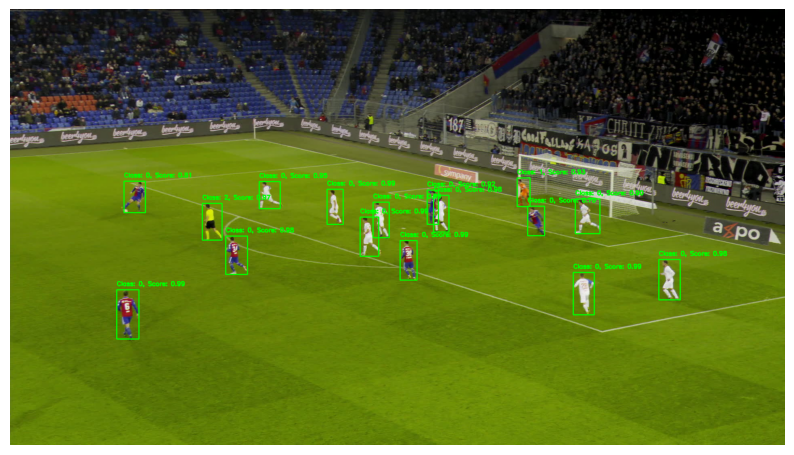

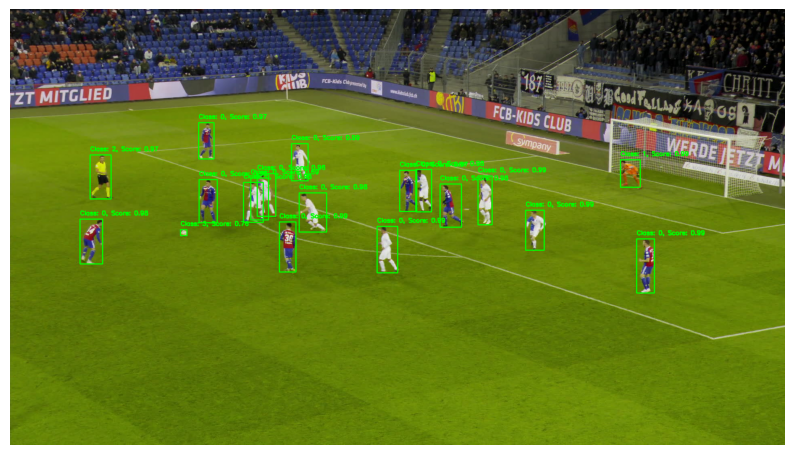

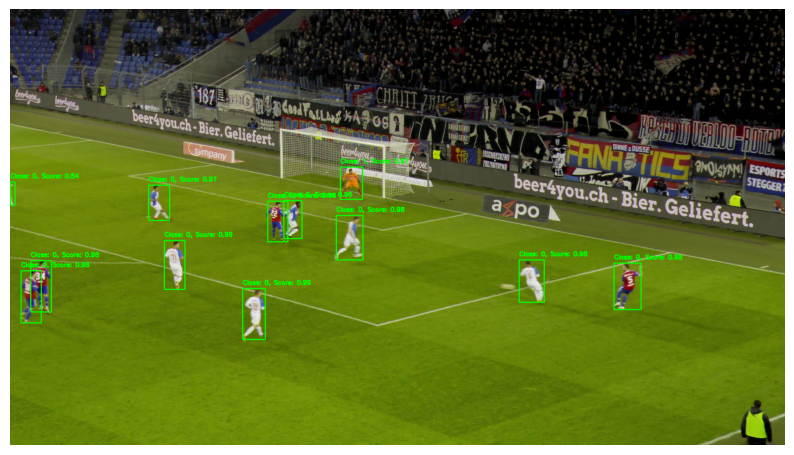

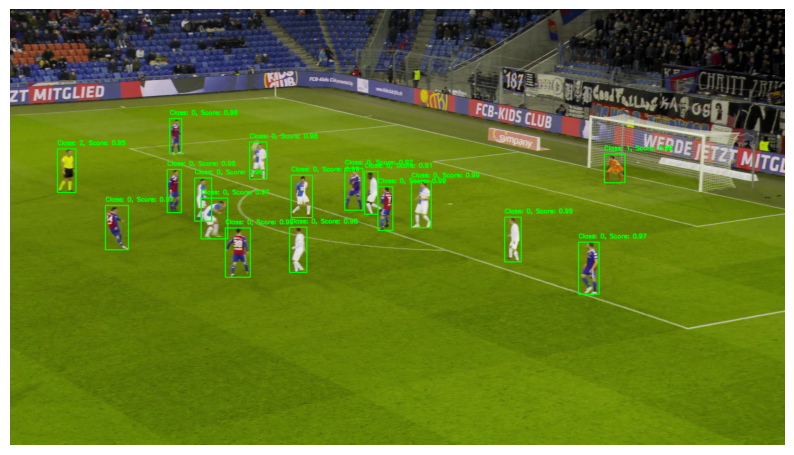

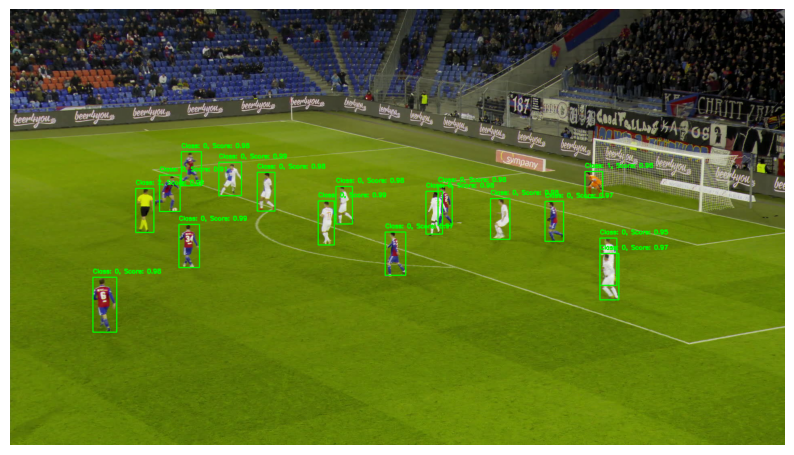

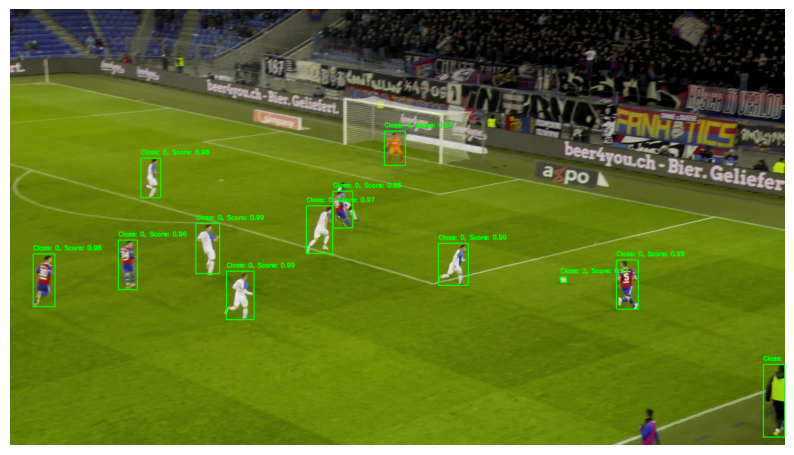

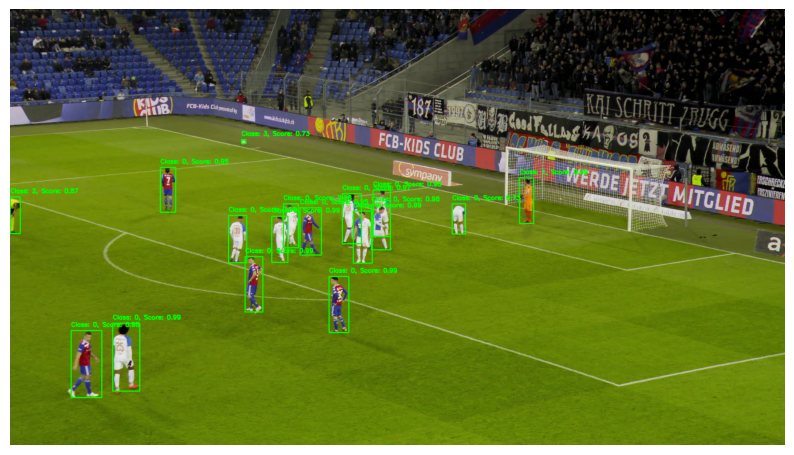

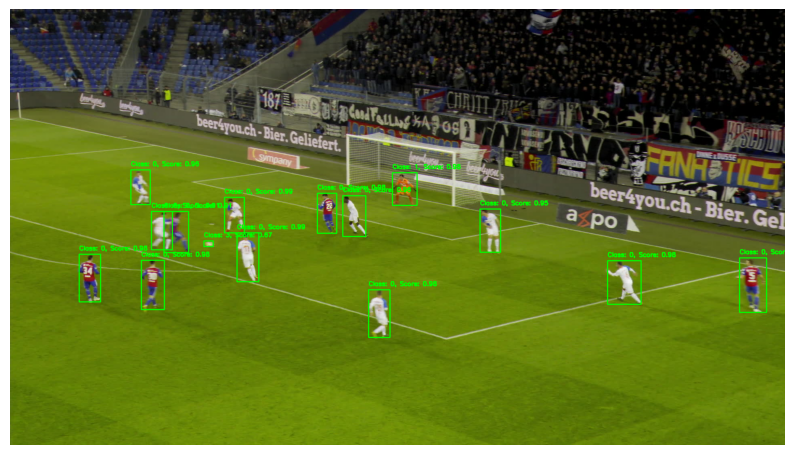

Обработка изображений завершена.


In [ ]:
import cv2
import glob
import os

# Путь к папке с изображениями
image_folder = '/content/image/'  # Замените на путь к папке с изображениями
output_folder = '/content/image_out/'  # Папка, где будут сохраняться результаты

# Создайте папку для результатов, если она не существует
if not os.path.exists(output_folder):
    os.makedirs(output_folder)

# Пройдем по изображениям
for image_path in glob.glob(image_folder + '*.jpg'):  # Здесь можно поменять расширение на нужное
    # Чтение изображения
    image = cv2.imread(image_path)

    # Предсказание для изображения
    outputs = predictor(image)

    # Отрисовка предсказаний
    instances = outputs["instances"]
    classes = instances.pred_classes  # Предсказанные классы
    scores = instances.scores  # Проценты уверенности
    boxes = instances.pred_boxes.tensor.cpu().numpy()  # Координаты боксов

    for i, box in enumerate(boxes):
        x1, y1, x2, y2 = box
        class_id = int(classes[i])
        score = scores[i]
        label = f'Class: {class_id}, Score: {score:.2f}'

        # Отрисовка бокса
        cv2.rectangle(image, (int(x1), int(y1)), (int(x2), int(y2)), (0, 255, 0), 2)
        # Отрисовка текста
        cv2.putText(image, label, (int(x1), int(y1) - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

    # Отображение изображения с предсказаниями в консоли
    plt.figure(figsize=(10, 10))
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))  # Преобразуем BGR в RGB для корректного отображения
    plt.axis('off')  # Отключаем оси
    plt.show()

print("Обработка изображений завершена.")


## Предсказание на видеофрагменте + отрисовка траектории

In [ ]:
import cv2
import time

# Откройте видео
video_path = '/content/SNGS-001.mp4'  # Замените на путь к вашему видео
cap = cv2.VideoCapture(video_path)

# Получаем параметры видео
fps = cap.get(cv2.CAP_PROP_FPS)
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

# Настроим видео для сохранения
output_video = cv2.VideoWriter('output_video.mp4', cv2.VideoWriter_fourcc(*'mp4v'), fps, (width, height))

# Список для хранения координат траектории мяча и времени их добавления
ball_trajectory = []

# Время, через которое точки траектории должны исчезать (в секундах)
trajectory_lifetime = 5.0

# Пройдем по кадрам видео
frame_count = 0
while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    # Увеличиваем счетчик кадров
    frame_count += 1

    # Вычисляем текущее время в секундах для данного кадра
    current_time = frame_count / fps

    # Предсказание для кадра
    outputs = predictor(frame)

    # Отрисовка предсказаний
    instances = outputs["instances"]
    classes = instances.pred_classes  # Предсказанные классы
    scores = instances.scores  # Проценты уверенности
    boxes = instances.pred_boxes.tensor.cpu().numpy()  # Координаты боксов

    for i, box in enumerate(boxes):
        x1, y1, x2, y2 = box
        class_id = int(classes[i])
        score = scores[i]
        label = f'Class: {class_id}, Score: {score:.2f}'

        # Отрисовка бокса
        cv2.rectangle(frame, (int(x1), int(y1)), (int(x2), int(y2)), (0, 255, 0), 2)
        # Отрисовка текста
        cv2.putText(frame, label, (int(x1), int(y1) - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

        # Проверяем, является ли объект мячом (class_id == 3)
        if class_id == 3:
            # Вычисляем центр бокса мяча и добавляем координаты с текущим временем
            ball_center = (int((x1 + x2) // 2), int((y1 + y2) // 2))
            ball_trajectory.append((ball_center, current_time))

    # Отфильтровываем точки, которые не старше 5 секунд
    ball_trajectory = [(pt, t) for pt, t in ball_trajectory if current_time - t <= trajectory_lifetime]

    # Отрисовываем траекторию движения мяча
    for j in range(1, len(ball_trajectory)):
        pt1, time1 = ball_trajectory[j - 1]
        pt2, time2 = ball_trajectory[j]
        cv2.line(frame, pt1, pt2, (0, 0, 255), 2)

    # Записываем результат в файл
    output_video.write(frame)

# Завершение работы с видео
cap.release()
output_video.release()
cv2.destroyAllWindows()


KeyboardInterrupt: 

# Дополнительно

## Посмотреть изображения где есть класс other

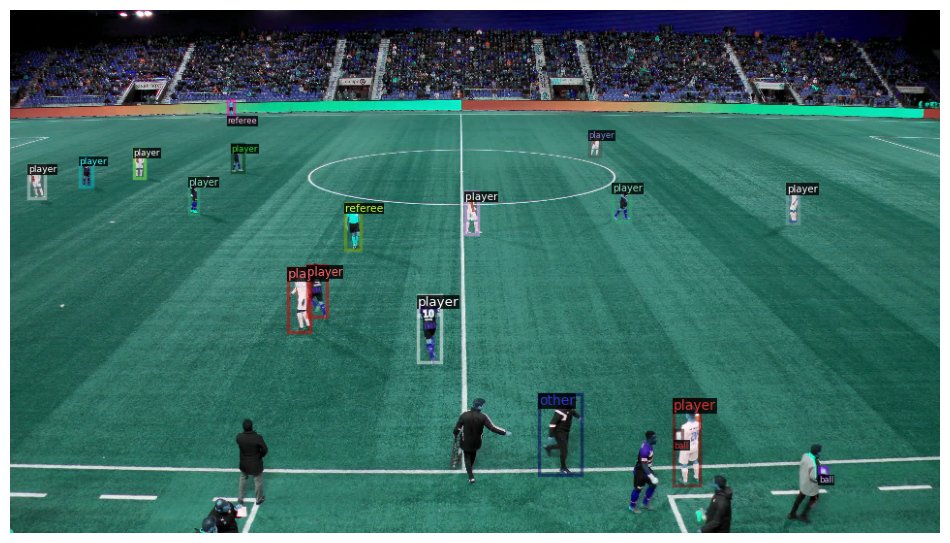

In [ ]:
import cv2
import random
from detectron2.data import DatasetCatalog, MetadataCatalog
from detectron2.utils.visualizer import Visualizer
import matplotlib.pyplot as plt

# Загрузим датасет
dataset_dicts = DatasetCatalog.get("train_dataset")
metadata = MetadataCatalog.get("train_dataset")

# Класс, который ищем
other_class_id = metadata.thing_classes.index("other")

# Найдем изображения с классом 'other'
other_images = []
for d in dataset_dicts:
    for annotation in d["annotations"]:
        if annotation["category_id"] == other_class_id:
            other_images.append(d)
            break  # Останавливаем цикл по аннотациям, если нашли 'other'

# Визуализируем случайное изображение с 'other'
random_image = random.choice(other_images)
img = cv2.imread(random_image["file_name"])
visualizer = Visualizer(img[:, :, ::-1], metadata=metadata, scale=0.5)
out = visualizer.draw_dataset_dict(random_image)

# Отображаем изображение с matplotlib
plt.figure(figsize=(12, 8))
plt.imshow(out.get_image()[:, :, ::-1])
plt.axis('off')
plt.show()


## Посмотреть изображения где есть класс Ball

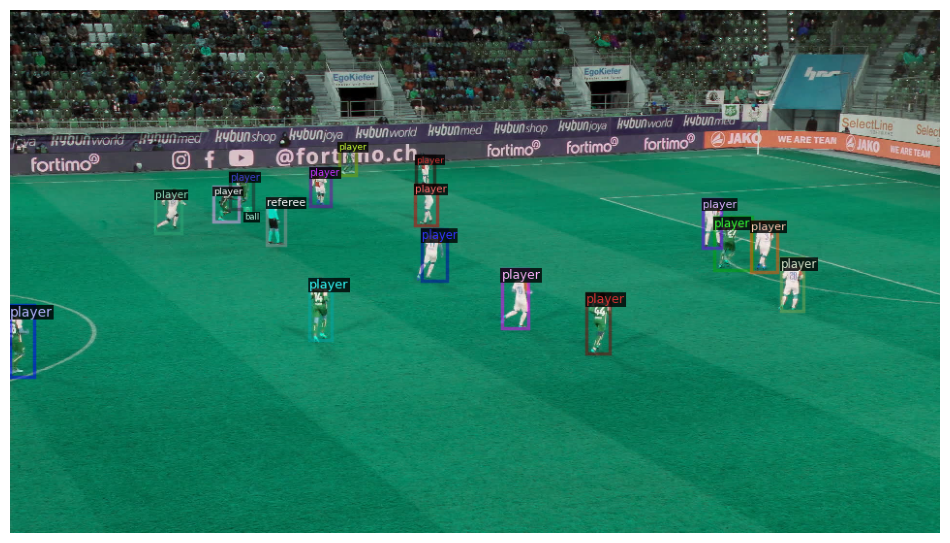

In [ ]:
import cv2
import random
from detectron2.data import DatasetCatalog, MetadataCatalog
from detectron2.utils.visualizer import Visualizer
import matplotlib.pyplot as plt

# Загрузим датасет
dataset_dicts = DatasetCatalog.get("train_dataset")
metadata = MetadataCatalog.get("train_dataset")

# Класс, который ищем
ball_class_id = metadata.thing_classes.index("ball")

# Найдем изображения с классом 'ball'
ball_images = []
for d in dataset_dicts:
    for annotation in d["annotations"]:
        if annotation["category_id"] == ball_class_id:
            ball_images.append(d)
            break  # Останавливаем цикл по аннотациям, если нашли 'ball'

# Визуализируем случайное изображение с 'ball'
random_image = random.choice(ball_images)
img = cv2.imread(random_image["file_name"])
visualizer = Visualizer(img[:, :, ::-1], metadata=metadata, scale=0.5)
out = visualizer.draw_dataset_dict(random_image)

# Отображаем изображение с matplotlib
plt.figure(figsize=(12, 8))
plt.imshow(out.get_image()[:, :, ::-1])
plt.axis('off')
plt.show()


## Панель Обучения

In [ ]:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

In [ ]:
print(DatasetCatalog.list())  #список зарегестрированных датасетов


In [ ]:
import torch

# Проверяем, доступна ли CUDA
if torch.cuda.is_available():
    print("CUDA доступна!")
    # Получаем информацию о GPU
    print(f"Количество доступных GPU: {torch.cuda.device_count()}")
    for i in range(torch.cuda.device_count()):
        print(f"GPU {i}: {torch.cuda.get_device_name(i)}")
else:
    print("CUDA не доступна.")
